In [1]:
from __future__ import print_function
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
import torchvision.models as models
import copy

/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/matplotlib/__init__.py:1067: UserWarning: Duplicate key in file "/home/ubuntu/.config/matplotlib/matplotlibrc", line #2
  (fname, cnt))
/home/ubuntu/anaconda3/envs/pytorch_p36/lib/python3.6/site-packages/matplotlib/__init__.py:1067: UserWarning: Duplicate key in file "/home/ubuntu/.config/matplotlib/matplotlibrc", line #3
  (fname, cnt))


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
im_size=(1000,1000) if torch.cuda.is_available() else 128
loader = transforms.Compose([transforms.Resize(im_size),
                            transforms.ToTensor()])
def image_loader(image_name):
    image=Image.open(image_name)
    image=loader(image).unsqueeze(0)
    return image.to(device,torch.float)
style_img=image_loader("style.jpeg")
content_img=image_loader("house.jpg")
assert style_img.size()==content_img.size()



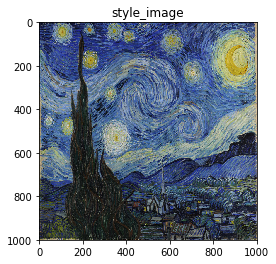

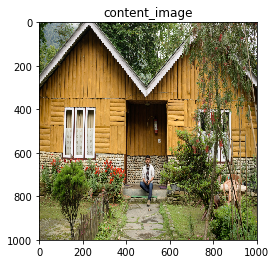

In [4]:
#display image
unloader=transforms.ToPILImage()
def imshow(tensor,title=None):
    image=tensor.cpu().clone()
    image=image.squeeze(0)
    image=unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)
plt.figure()    
imshow(style_img,title='style_image')
imshow(content_img,title='content_image')
    
    

In [5]:
print(content_img.size())
style_img.size()

torch.Size([1, 3, 1000, 1000])


torch.Size([1, 3, 1000, 1000])

In [6]:
class ContentLoss(nn.Module):
    def __init__(self,target):
        super(ContentLoss,self).__init__()
        self.target=target.detach()
    def forward(self,input):
        self.loss=F.mse_loss(input,self.target)
        return input
def gram_matrix(input):
    a,b,c,d =input.size()
    features=input.view(a*b,c*d)
    G_matrix=torch.mm(features,features.t())
    return G_matrix.div(a*b*c*d)

class StyleLoss(nn.Module):
    def __init__(self,target_feature):
        super(StyleLoss,self).__init__()
        self.target=gram_matrix(target_feature).detach()
    def forward(self,input):
        G=gram_matrix(input)
        self.loss=F.mse_loss(G,self.target)
        return input    
    

In [7]:
cnn=models.vgg19(pretrained=True).features.to(device).eval()

In [8]:
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)
 
class Normalization(nn.Module):
    def __init__(self,mean,std):
        super(Normalization,self).__init__()
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)
    
    def forward(self,img):
        return (img-self.mean)/self.std
    
content_layer_default=['conv_5']
style_layer_default=['conv_1','conv_2','conv_3','conv_4','conv_5']

def get_style_model_and_losses(cnn,normalization_mean,normalization_std,
                               content_img,style_img,content_layers=content_layer_default,
                               style_layers=style_layer_default):
    cnn=copy.deepcopy(cnn)
    normalization=Normalization(normalization_mean,normalization_std)
    model=nn.Sequential(normalization)
    content_losses=[]
    style_losses=[]
    i=0
    for layer in cnn.children():
        if isinstance(layer,nn.Conv2d):
            i+=1
            name='conv_{}'.format(i)
        elif isinstance(layer,nn.ReLU):
            name='relu_{}'.format(i)
            layer=nn.ReLU(inplace=False)
        elif isinstance(layer,nn.MaxPool2d):
            name='pool_{}'.format(i)
        elif isinstance(layer,nn.BatchNorm2d):
            name='bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))
        
        model.add_module(name,layer)
        
        if name in content_layers:
            target=model(content_img).detach()
            content_loss=ContentLoss(target)
            model.add_module('content_loss_{}'.format(i),content_loss)
            content_losses.append(content_loss)
        
        if name in style_layers:
            target_feature=model(style_img).detach()
            style_loss=StyleLoss(target_feature)
            model.add_module('style_loss_{}'.format(i),style_loss)
            style_losses.append(style_loss)
    for i in range(len(model)-1,-1,-1):
        if isinstance(model[i],ContentLoss) or isinstance(model[i],StyleLoss):
            break
    model=model[:(i+1)]    
    return model,content_losses,style_losses        
        
            
    
    


In [9]:
input_img = content_img.clone()

def get_optimizer(input_img):
    optimizer=optim.LBFGS([input_img.requires_grad_()])
    return optimizer

def run_style_transfer(cnn,normalization_mean,normalization_std,content_image,style_image,
                       input_img,num_steps=3000
                      ,style_weight=100000,content_weight=10):
    print('Building Style transfer model')
    model,content_losses,style_losses=get_style_model_and_losses(cnn,normalization_mean,normalization_std,content_img,style_img)
    optimizer=get_optimizer(input_img)
    run=[0]
    print('Optimizing')
    while run[0]<=num_steps:
        
        def closure():
            input_img.data.clamp(0,1)
            optimizer.zero_grad()
            model(input_img)
            style_score=0
            content_score=0
            for sl in style_losses:
                style_score+=sl.loss
            for cl in content_losses:
                content_score+=cl.loss
            style_score*=style_weight
            content_score*=content_weight
            loss=style_score+content_score
            loss.backward()
            run[0]+=1
            if run[0]%50==0:
                print("run {}:" .format(run))
                print('Style Score :{:4f}  Content Score :{:4f}' .format(style_score.item(),
                                                                       content_score.item()))
                imshow(input_img, title='Output Image')
                print()
            return style_score+content_score
        optimizer.step(closure)
    input_img.data.clamp_(0,1)
    return input_img
        
    
    

Building Style transfer model
Optimizing
run [50]:
Style Score :31.673082  Content Score :96.920326


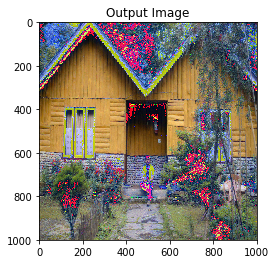


run [100]:
Style Score :25.501816  Content Score :89.660812


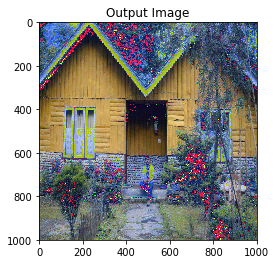


run [150]:
Style Score :24.103895  Content Score :88.084602


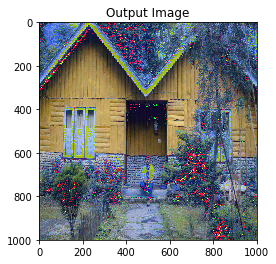


run [200]:
Style Score :23.656694  Content Score :87.368843


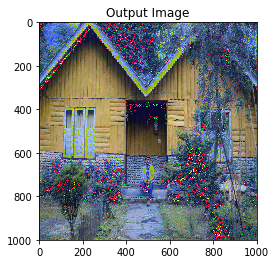


run [250]:
Style Score :23.407116  Content Score :86.958611


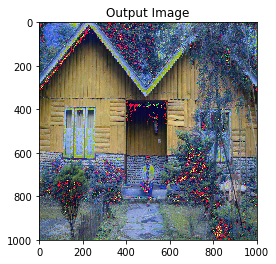


run [300]:
Style Score :23.275471  Content Score :86.659386


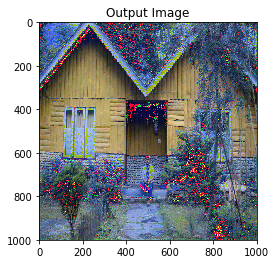


run [350]:
Style Score :23.189411  Content Score :86.440056


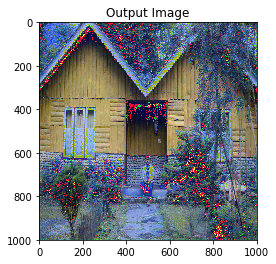


run [400]:
Style Score :23.132236  Content Score :86.270439


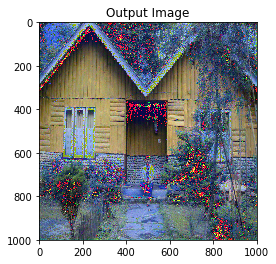


run [450]:
Style Score :23.088072  Content Score :86.137573


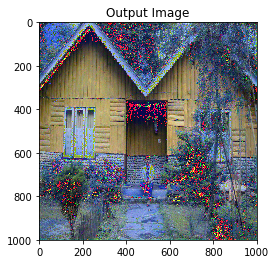


run [500]:
Style Score :23.053812  Content Score :86.029121


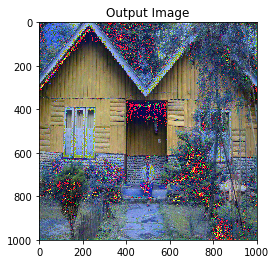


run [550]:
Style Score :23.027435  Content Score :85.938683


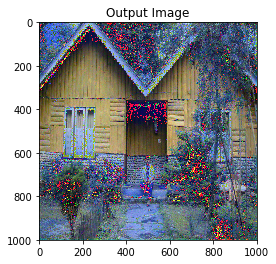


run [600]:
Style Score :23.005510  Content Score :85.862244


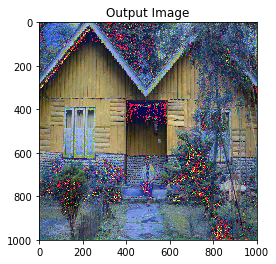


run [650]:
Style Score :22.990927  Content Score :85.791100


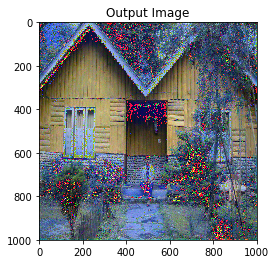


run [700]:
Style Score :22.974091  Content Score :85.733704


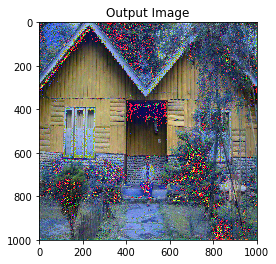


run [750]:
Style Score :22.961279  Content Score :85.680779


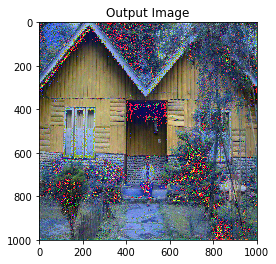


run [800]:
Style Score :22.950832  Content Score :85.632584


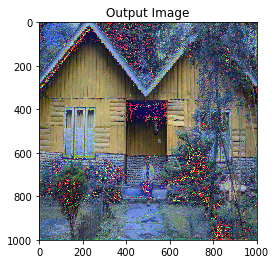


run [850]:
Style Score :22.941229  Content Score :85.589310


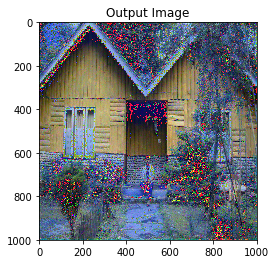


run [900]:
Style Score :22.933315  Content Score :85.549225


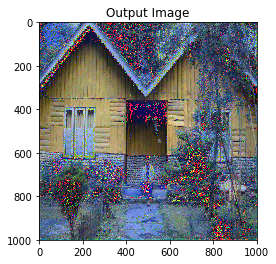


run [950]:
Style Score :22.926441  Content Score :85.512344


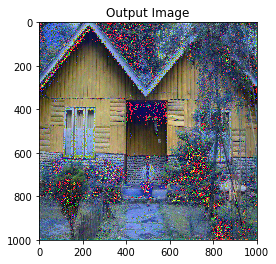


run [1000]:
Style Score :22.919407  Content Score :85.478935


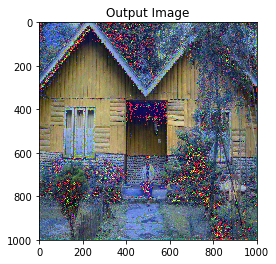


run [1050]:
Style Score :22.913380  Content Score :85.447937


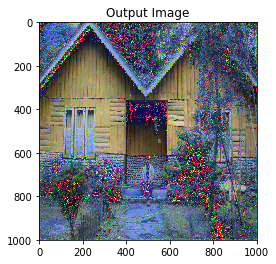


run [1100]:
Style Score :22.909487  Content Score :85.417297


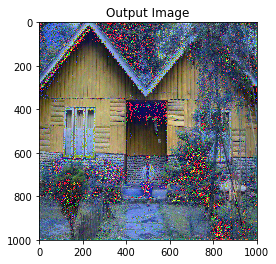


run [1150]:
Style Score :22.904661  Content Score :85.389740


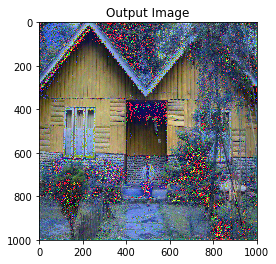


run [1200]:
Style Score :22.901590  Content Score :85.362473


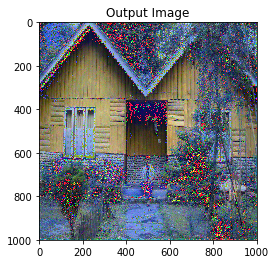


run [1250]:
Style Score :22.897886  Content Score :85.337570


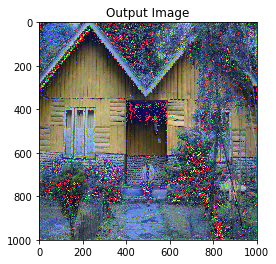


run [1300]:
Style Score :22.895288  Content Score :85.313408


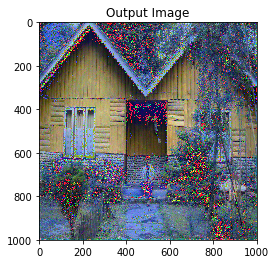


run [1350]:
Style Score :22.892313  Content Score :85.290825


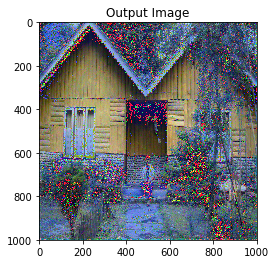


run [1400]:
Style Score :22.890259  Content Score :85.268799


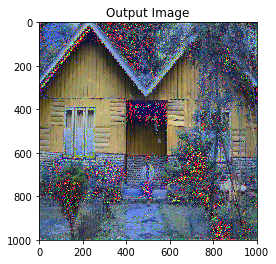


run [1450]:
Style Score :22.887112  Content Score :85.249069


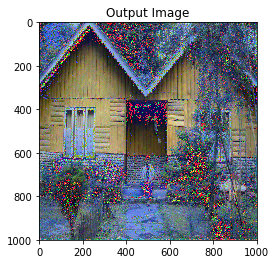


run [1500]:
Style Score :22.884197  Content Score :85.230576


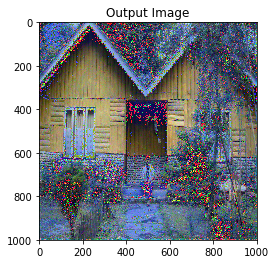


run [1550]:
Style Score :22.881321  Content Score :85.213005


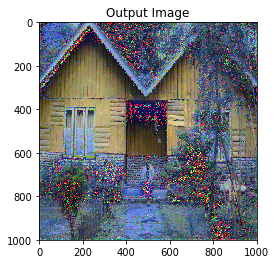


run [1600]:
Style Score :22.878716  Content Score :85.196167


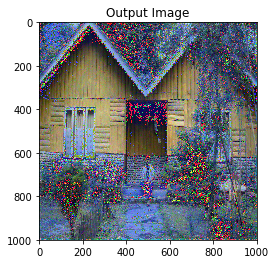


run [1650]:
Style Score :22.876293  Content Score :85.179939


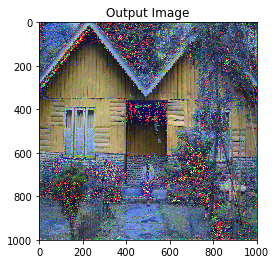


run [1700]:
Style Score :22.873447  Content Score :85.164955


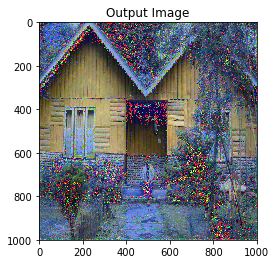


run [1750]:
Style Score :22.872570  Content Score :85.148781


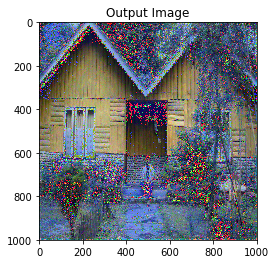


run [1800]:
Style Score :22.870413  Content Score :85.134575


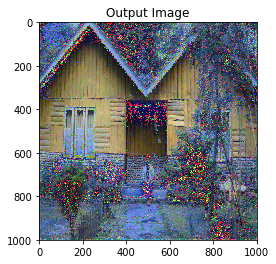


run [1850]:
Style Score :22.868120  Content Score :85.121223


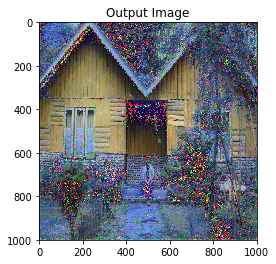


run [1900]:
Style Score :22.866207  Content Score :85.108025


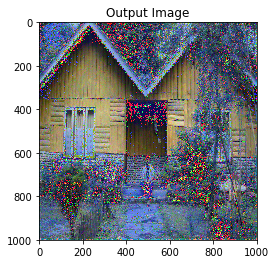


run [1950]:
Style Score :22.865133  Content Score :85.094681


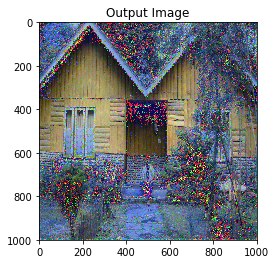


run [2000]:
Style Score :22.863945  Content Score :85.081902


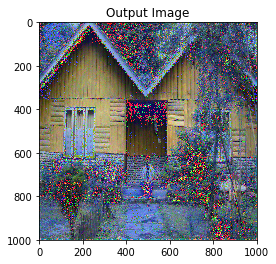


run [2050]:
Style Score :22.861107  Content Score :85.071175


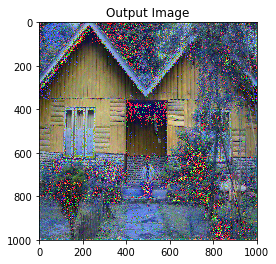


run [2100]:
Style Score :22.860664  Content Score :85.058624


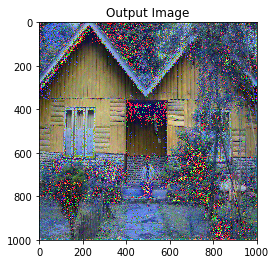


run [2150]:
Style Score :22.859673  Content Score :85.047104


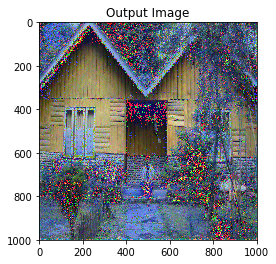


run [2200]:
Style Score :22.857948  Content Score :85.036766


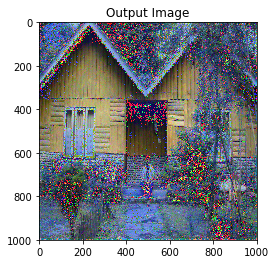


run [2250]:
Style Score :22.856947  Content Score :85.026100


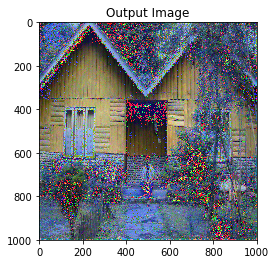


run [2300]:
Style Score :22.855255  Content Score :85.016518


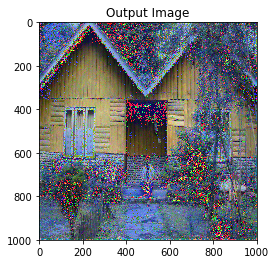


run [2350]:
Style Score :22.853436  Content Score :85.007317


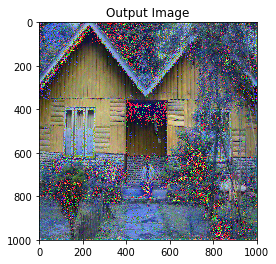


run [2400]:
Style Score :22.852428  Content Score :84.997673


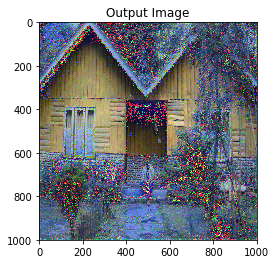


run [2450]:
Style Score :22.850502  Content Score :84.989380


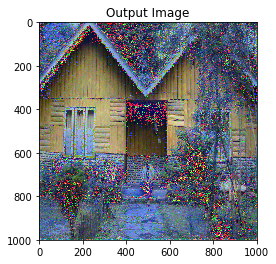


run [2500]:
Style Score :22.850607  Content Score :84.979286


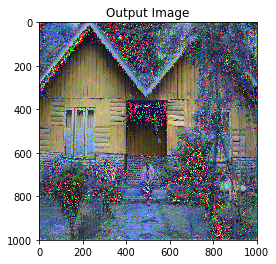


run [2550]:
Style Score :22.849457  Content Score :84.970810


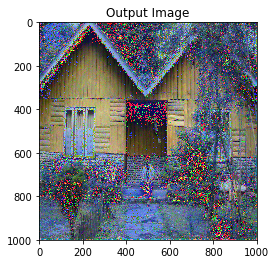


run [2600]:
Style Score :22.848360  Content Score :84.962570


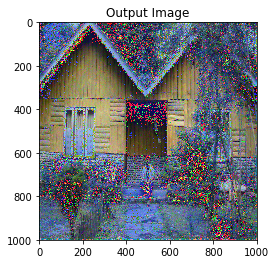


run [2650]:
Style Score :22.846163  Content Score :84.955612


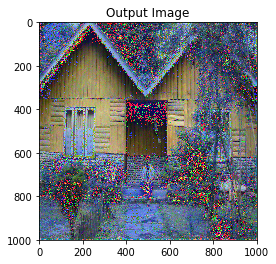

In [ ]:
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img)

plt.figure()
imshow(output, title='Output Image')

# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()


In [14]:
import torchvision

In [16]:
torchvision.utils.save_image(output,'styled.jpg')